# Fast.ai Lesson 8: 目标检测

fast.ai 0.7版本

Pytorch 0.3版本

In [1]:
# Jupyter 初始化
%matplotlib inline
%config InlineBackend.figure_format="retina"
%config InlineBackend.rc = {"figure.figsize": (7.5,4.5)}

%reload_ext autoreload
%autoreload 2

In [2]:
# import fast.ai packages
from fastai.conv_learner import *
from fastai.dataset import *

from pathlib import Path
import json
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects

In [3]:
# 指定GPUY
torch.cuda.set_device(0)

## Pascal VOC 数据集

官网 [The PASCAL Visual Object Classes Homepage](http://host.robots.ox.ac.uk/pascal/VOC/)

数据集镜像网站 [Pascal VOC Dataset Mirror](https://pjreddie.com/projects/pascal-voc-dataset-mirror/)

Json格式的标注文件更便于处理 https://storage.googleapis.com/coco-dataset/external/PASCAL_VOC.zip

这次实验用的是2007版本的数据集。

### 构建关系字典

In [4]:
# 查看文件
PATH = Path('data/pascal2007')
list(PATH.iterdir())

[PosixPath('data/pascal2007/tmp'),
 PosixPath('data/pascal2007/models'),
 PosixPath('data/pascal2007/pascal_test2007.json'),
 PosixPath('data/pascal2007/raw'),
 PosixPath('data/pascal2007/pascal_train2007.json'),
 PosixPath('data/pascal2007/pascal_val2007.json'),
 PosixPath('data/pascal2007/VOCdevkit'),
 PosixPath('data/pascal2007/pascal_train2012.json'),
 PosixPath('data/pascal2007/pascal_val2012.json')]

In [5]:
# 打开训练集 标注文件
trn_j = json.load((PATH/'pascal_train2007.json').open())
trn_j.keys()

dict_keys(['images', 'type', 'annotations', 'categories'])

In [6]:
# 使用常量来替代字符串：可以自动填充，防止拼写出错
IMAGES,ANNOTATIONS,CATEGORIES = ['images', 'annotations', 'categories']

In [7]:
trn_j[IMAGES][:5]

[{'file_name': '000012.jpg', 'height': 333, 'width': 500, 'id': 12},
 {'file_name': '000017.jpg', 'height': 364, 'width': 480, 'id': 17},
 {'file_name': '000023.jpg', 'height': 500, 'width': 334, 'id': 23},
 {'file_name': '000026.jpg', 'height': 333, 'width': 500, 'id': 26},
 {'file_name': '000032.jpg', 'height': 281, 'width': 500, 'id': 32}]

In [8]:
trn_j[ANNOTATIONS][:2]

[{'segmentation': [[155, 96, 155, 270, 351, 270, 351, 96]],
  'area': 34104,
  'iscrowd': 0,
  'image_id': 12,
  'bbox': [155, 96, 196, 174],
  'category_id': 7,
  'id': 1,
  'ignore': 0},
 {'segmentation': [[184, 61, 184, 199, 279, 199, 279, 61]],
  'area': 13110,
  'iscrowd': 0,
  'image_id': 17,
  'bbox': [184, 61, 95, 138],
  'category_id': 15,
  'id': 2,
  'ignore': 0}]

In [9]:
trn_j[CATEGORIES][:5]

[{'supercategory': 'none', 'id': 1, 'name': 'aeroplane'},
 {'supercategory': 'none', 'id': 2, 'name': 'bicycle'},
 {'supercategory': 'none', 'id': 3, 'name': 'bird'},
 {'supercategory': 'none', 'id': 4, 'name': 'boat'},
 {'supercategory': 'none', 'id': 5, 'name': 'bottle'}]

In [10]:
# 使用常量来替代字符串：可以自动填充，防止拼写出错
FILE_NAME,ID,IMG_ID,CAT_ID,BBOX = ['file_name','id','image_id','category_id','bbox']

# 构建字典:分类ID->分类名称
cats = {o[ID]:o['name'] for o in trn_j[CATEGORIES]}
# 构建字典：图像ID->图像名称
trn_fns = {o[ID]:o[FILE_NAME] for o in trn_j[IMAGES]}
# 构建图像编号序列，用以查询是否存在此图
trn_ids = {o[ID] for o in trn_j[IMAGES]}

In [11]:
# 查看PASCAL数据集文件
list((PATH/'VOCdevkit'/'VOC2007').iterdir())

[PosixPath('data/pascal2007/VOCdevkit/VOC2007/SegmentationObject'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/JPEGImages'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/ImageSets'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/SegmentationClass'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/Annotations')]

In [12]:
# 设置数据集图像路径
JPEGS = "VOCdevkit/VOC2007/JPEGImages"

In [13]:
# 验证路径设置
IMG_PATH = PATH/JPEGS
list(IMG_PATH.iterdir())[:5]

[PosixPath('data/pascal2007/VOCdevkit/VOC2007/JPEGImages/005601.jpg'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/JPEGImages/009666.jpg'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/JPEGImages/008026.jpg'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/JPEGImages/004041.jpg'),
 PosixPath('data/pascal2007/VOCdevkit/VOC2007/JPEGImages/008781.jpg')]

In [14]:
# 每张图像都有一个独立的ID
im0_d = trn_j[IMAGES][0]
im0_d[FILE_NAME],im0_d[ID]

('000012.jpg', 12)

### BBox转换

Python中的collections.defaultdict()可以有效解决字典使用中的默认值设置问题。

参考链接： [Python中collections.defaultdict()使用](https://www.jianshu.com/p/26df28b3bfc8)

In [15]:
# 将PASCAL数据集中，bbox的形式从高/宽的方式转换成左上角/右下角的形式
def hw_bb(bb): 
    return np.array([bb[1], bb[0], bb[3]+bb[1]-1, bb[2]+bb[0]-1])

# 构建标注字典，图像ID->bbx集(bbx,分类ID)，默认为空序列
trn_anno = collections.defaultdict(lambda: [])

for o in trn_j[ANNOTATIONS]:
    if not o['ignore']:
        bbx = o[BBOX]
        bbx = hw_bb(bbx)
        trn_anno[o[IMG_ID]].append((bbx, o[CAT_ID]))

# 查看标注长度
len(trn_anno)

2501

In [16]:
# 抽查,一幅图对应的标注序列
im_a = trn_anno[im0_d[ID]];
im_a

[(array([ 96, 155, 269, 350]), 7)]

In [17]:
# 抽查，一幅图中标注序列的第一个标注
im0_a = im_a[0];
im0_a

(array([ 96, 155, 269, 350]), 7)

In [18]:
# 根据分类ID查看分类名称
# cats[7]
cats[im0_a[1]]

'car'

In [19]:
trn_anno[17]

[(array([ 61, 184, 198, 278]), 15), (array([ 77,  89, 335, 402]), 13)]

In [20]:
cats[15],cats[13]

('person', 'horse')

有些图表库在绘制时采用的跟VOC的格式相同，所以也可以添加一个函数用于，将左上角/右下角转换成宽和高。

In [21]:
bb_voc = [155, 96, 196, 174]
bb_fastai = hw_bb(bb_voc)

In [22]:
# 将左上角/右下角转换成宽和高形式。
def bb_hw(a):
    return np.array([a[1],a[0],a[3]-a[1]+1,a[2]-a[0]+1])

In [23]:
f'expected: {bb_voc}, actual: {bb_hw(bb_fastai)}'

'expected: [155, 96, 196, 174], actual: [155  96 196 174]'

### 实现图像标注显示

fast.ai库中打开图像是通过opencv打开的，效率比PIL方式快很多。

OpenCV打开的速度比Torchvision快5-10倍。同时，fast.ai快的原因不是采用多进程而是采用多线程进行数据增强处理。

坚持用Opencv来做数据增强，而不要采用TorchVision或者Pillow。

In [24]:
# 调用fast.ai的open_image函数打开图像
im = open_image(IMG_PATH/im0_d[FILE_NAME])

Matplotlib中的plt.subplots是一个面向对象的非常实用的工具。

In [25]:
# 定义一个显示图像的函数
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return ax

fast.ai的作者的创意：无视背景色的前景文本和矩形框，加一个包边处理。

In [26]:
# 画出bbox的黑色包边效果
def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

In [27]:
# 画出bbox的白色包边
def draw_rect(ax, b):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)

In [28]:
# 白色标签文字，并加上黑色包边
def draw_text(ax, xy, txt, sz=14):
    text = ax.text(*xy, txt,
        verticalalignment='top', color='white', fontsize=sz, weight='bold')
    draw_outline(text, 1)

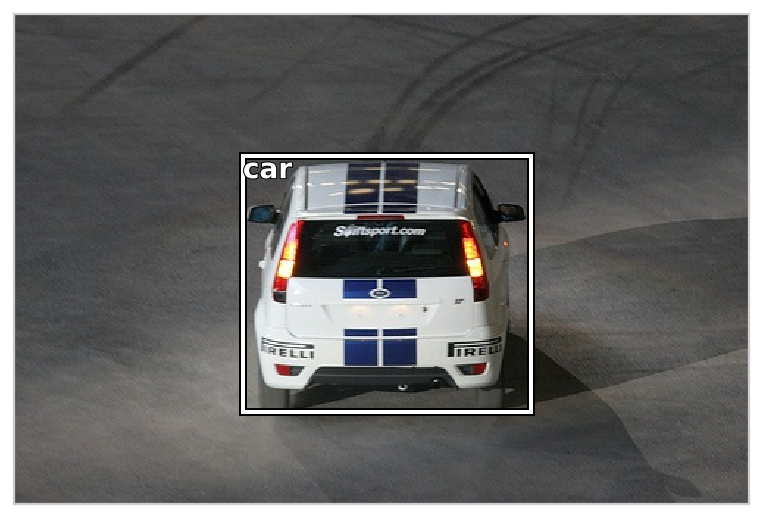

In [29]:
ax = show_img(im)
b = bb_hw(im0_a[0])
draw_rect(ax, b)
draw_text(ax, b[:2], cats[im0_a[1]]) #b[:2]是左上角的点

In [30]:
# 定义一个画图和标注的函数
def draw_im(im, ann):
    ax = show_img(im, figsize=(16,8))
    for b,c in ann:
        b = bb_hw(b)
        draw_rect(ax, b)
        draw_text(ax, b[:2], cats[c], sz=16)

In [31]:
# 定义一个根据训练集图像ID,画出图像和标注的工具函数
def draw_idx(i):
    im_a = trn_anno[i]
    im = open_image(IMG_PATH/trn_fns[i])
    print(im.shape)
    draw_im(im, im_a)

(500, 333, 3)


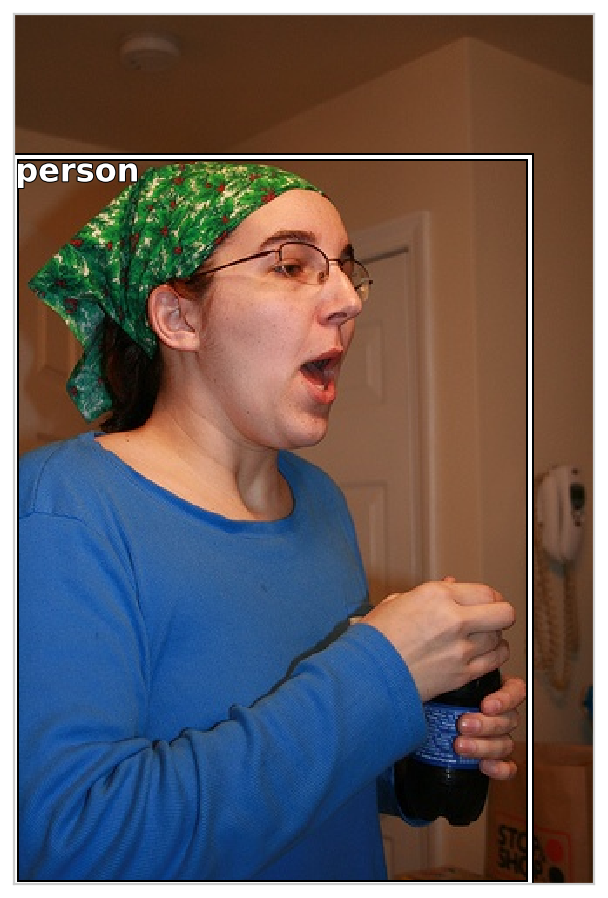

In [32]:
draw_idx(9654)

In [33]:
%debug

ERROR:root:No traceback has been produced, nothing to debug.


(364, 480, 3)


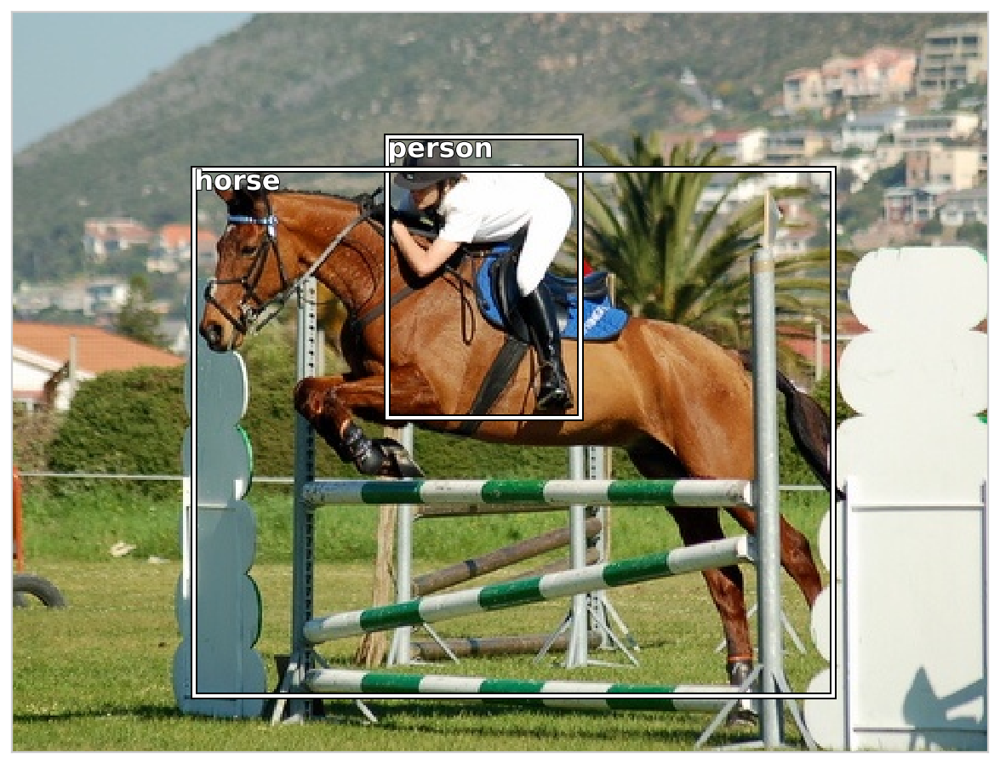

In [34]:
draw_idx(17)

## 最大目标分类器

实现图像中最大的目标的分类。下一步再进行定位。

分类器的训练集是将VOC数据集中最大标注面积的物体作为整幅图像的分类目标来做训练的。

### 创建分类数据集

In [35]:
# 定义一个函数
def get_lrg(a,b):
    if not b: raise Exception("b is null")
    # 按照bbox进行排序
    b = sorted(b, key=lambda x:np.product(x[0][-2:] - x[0][:2]), reverse=True)
    # 返回最大bbox
    return b[0]

lambda可以用来构建简单的函数，下面这个函数用lambda函数来表示对标注序列按照bbox面积进行排序

In [36]:
# 构建一个字典，图像ID->最大标注框和分类
trn_lrg_anno = {a: get_lrg(a,b) for a,b in trn_anno.items()}

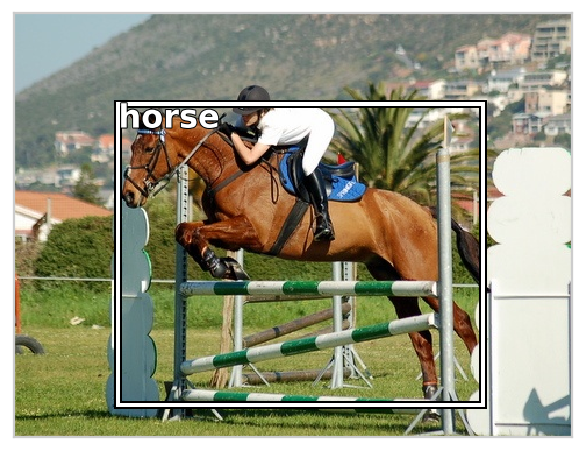

In [37]:
b,c = trn_lrg_anno[17]
b = bb_hw(b)
ax = show_img(open_image(IMG_PATH/trn_fns[17]), figsize=(5,10))
draw_rect(ax,b)
draw_text(ax,b[:2],cats[c],sz=16)

fast.ai库中构建许多创建数据集的方式，其中一个就是从CSV文件中构建数据集。

**所以，与其自己定义Dataset并构建数据集，不如直接将已有的数据保存到csv文件中，再调用API直接进行dataset和dataloader的生成**

In [38]:
# 定义路径
(PATH/'tmp').mkdir(exist_ok=True)
CSV = PATH/'tmp/lrg.csv'

In [39]:
# 创建一个csv用于保存图像名和分类
df = pd.DataFrame({'fn':[trn_fns[o] for o in trn_ids],
                      'cat':[cats[trn_lrg_anno[o][1]] for o in trn_ids]}, columns=['fn','cat'])
df.to_csv(CSV, index=False)

### 分类模型和训练

In [40]:
# 模型选择和超参数设置
f_model = resnet34
sz = 224
bs = 64

之所以要用CropType.NO是因为不像ImageNet那种数据（图像中主要目标在画面中心），Pascal数据集中很多情况下，目标又小，且在画面边缘，因此centerCrop会影响数据增强的实际效果。

In [41]:
# transformer和数据集
tfms = tfms_from_model(f_model=f_model, sz=sz, aug_tfms=transforms_side_on, crop_type=CropType.NO)
md = ImageClassifierData.from_csv(path=PATH, folder=JPEGS, csv_fname=CSV, tfms=tfms, bs=bs)

In [42]:
x,y = next(iter(md.val_dl))

所有ImageNet预训练的模型，都对数据输入做了Normalize处理（0均值1方差），因此想要得到正常的图像，需要进行逆归一化处理。

fast.ai提供了denorm方法。同时记得将GPU中的数据移到CPU的numpy中。

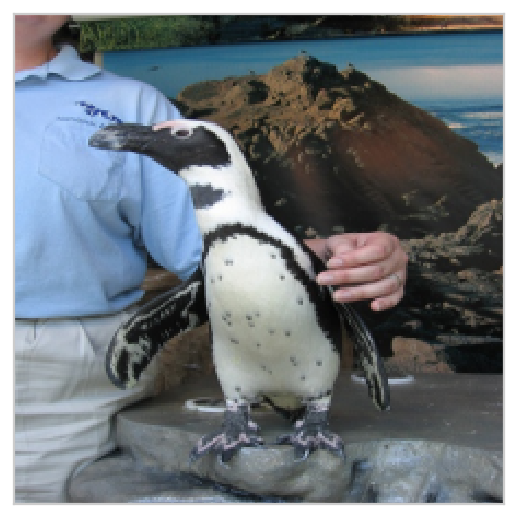

In [43]:
show_img(md.val_ds.denorm(to_np(x))[0]);

In [44]:
# 学习器设置和优化策略
learn = ConvLearner.pretrained(f=f_model, data=md, metrics=[accuracy])
learn.opt_fn = optim.Adam

 78%|███████▊  | 25/32 [00:05<00:00,  7.78it/s, loss=5.06]


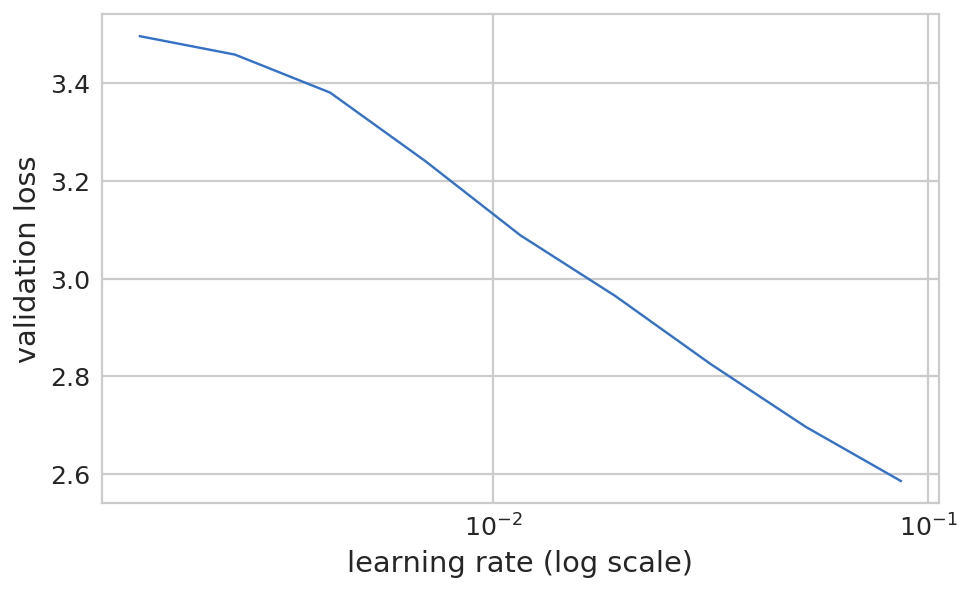

In [45]:
# 寻找最优lr
lrf=learn.lr_find(1e-5,100)
learn.sched.plot()

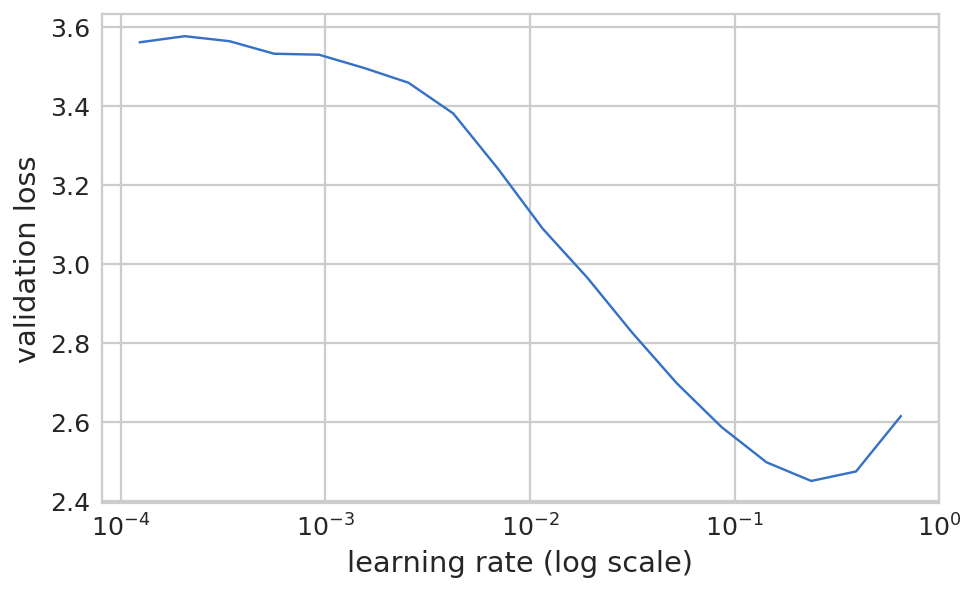

In [46]:
learn.sched.plot(n_skip=5, n_skip_end=1)

In [48]:
# 确认lr=2e-2
lr = 2e-2

In [49]:
learn.fit(lr, 1, cycle_len=1)

epoch      trn_loss   val_loss   accuracy                 
    0      1.252253   0.738965   0.766     



[array([0.73897]), 0.7660000019073486]

In [50]:
# 设置differencial learning rate
lrs = np.array([lr/1000,lr/100,lr])

In [51]:
# 解锁最后两层
learn.freeze_to(-2)

 84%|████████▍ | 27/32 [00:07<00:01,  4.02it/s, loss=2.05] 


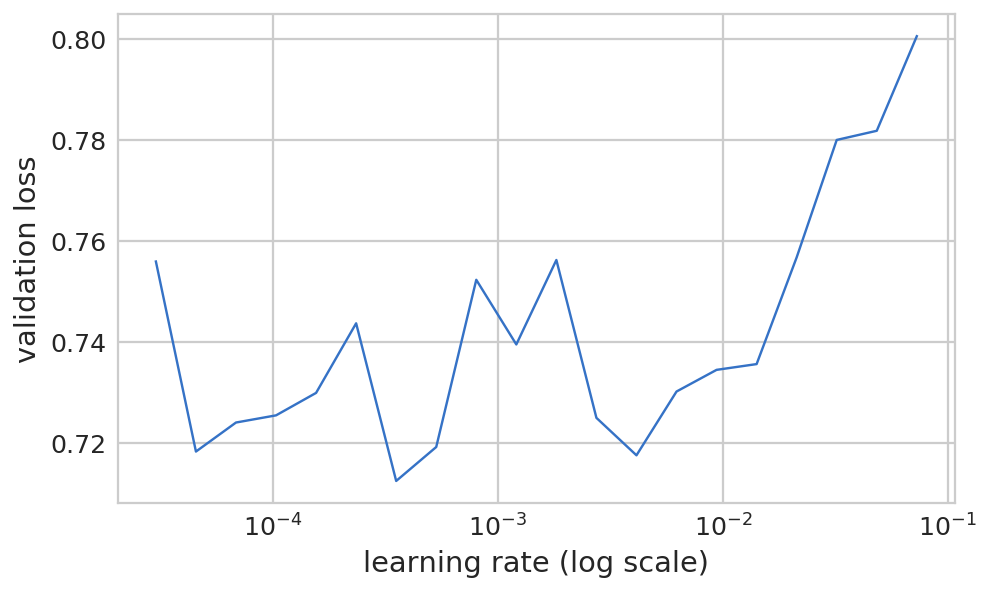

In [54]:
lrf=learn.lr_find(start_lr=lrs/1000)
learn.sched.plot(1)

In [55]:
learn.fit(lrs/5, 1, cycle_len=1)

epoch      trn_loss   val_loss   accuracy                  
    0      0.761318   0.678066   0.772     



[array([0.67807]), 0.7720000019073486]

准确率不高可能是因为图像中有很多明显的目标，所以没有单分类时的图像识别的准确率高

In [56]:
learn.unfreeze()

In [57]:
learn.fit(lrs/5, 1, cycle_len=2)

epoch      trn_loss   val_loss   accuracy                  
    0      0.598608   0.650308   0.794     
    1      0.429849   0.63418    0.798                     



[array([0.63418]), 0.7980000004768372]

In [58]:
# 模型保存和加载
learn.save('clas_one')
learn.load('clas_one')

### 分类测试

In [59]:
# 进行一个batch的测试
x,y = next(iter(md.val_dl))
probs = F.softmax(predict_batch(learn.model, x), -1)
X,preds = to_np(x), to_np(probs)
preds = np.argmax(preds, -1)

<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

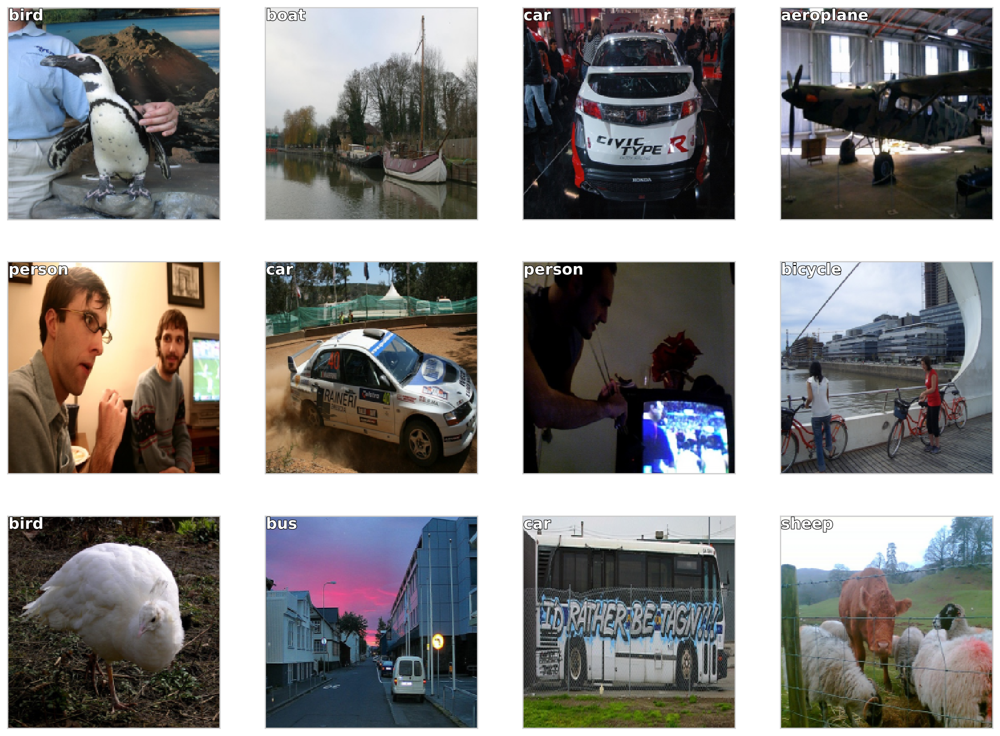

In [63]:
# 绘制分类结果
fig,axes = plt.subplots(3,4, figsize = (16,12))
for i,ax in enumerate(axes.flat):
    ima = md.val_ds.denorm(x)[i]
    b = md.classes[preds[i]]
    ax = show_img(ima, ax = ax)
    draw_text(ax, (0,0),b)
plt.tight_layout

## BBox预测

寻找最大物体的bounding box, 只是用简单的回归预测，（4输出）。

### 创建BBox的CSV文件

In [65]:
# 创建一个具有多标签的CSV文件
BB_CSV = PATH/'tmp/bb.csv'

In [66]:
bb = np.array([trn_lrg_anno[o][0] for o in trn_ids])
bbs = [' '.join(str(p) for p in o) for o in bb]

df = pd.DataFrame({'fn':[trn_fns[o] for o in trn_ids], 'bbox': bbs}, columns=['fn','bbox'])
df.to_csv(BB_CSV, index=False)

In [68]:
BB_CSV.open().readlines()[:5]

['fn,bbox\n',
 '008197.jpg,186 450 226 496\n',
 '008199.jpg,84 363 374 498\n',
 '008202.jpg,110 190 371 457\n',
 '008203.jpg,187 37 359 303\n']

### 模型和训练

In [88]:
# 设置模型和超参数
f_model = resnet34
sz = 224
bs = 64

#### Data Augmentation

In [89]:
# 自定义数据增广方式
augs = [RandomFlip(), 
        RandomRotate(30),
        RandomLighting(0.1,0.1)]

设置`continuous=True`是为了设置fastai处理一个回归问题，这个状态下，标签数据将不会被热编码。同时采用MSE作为默认的评估函数。

设置`CropType.NO`是因为想要将矩形的图像压成正方形的图像，而不是采用center cropping, 采用center cropping可能会丢失目标。因为这是多目标图像，而不是类似ImageNet的单目标图像。

In [90]:
tfms = tfms_from_model(f_model=f_model, sz=sz, aug_tfms=augs, crop_type=CropType.NO)
md = ImageClassifierData.from_csv(path=PATH, folder=JPEGS, csv_fname=BB_CSV, tfms=tfms, continuous=True, bs= bs)

[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]
[ 51. 102. 449. 222.]


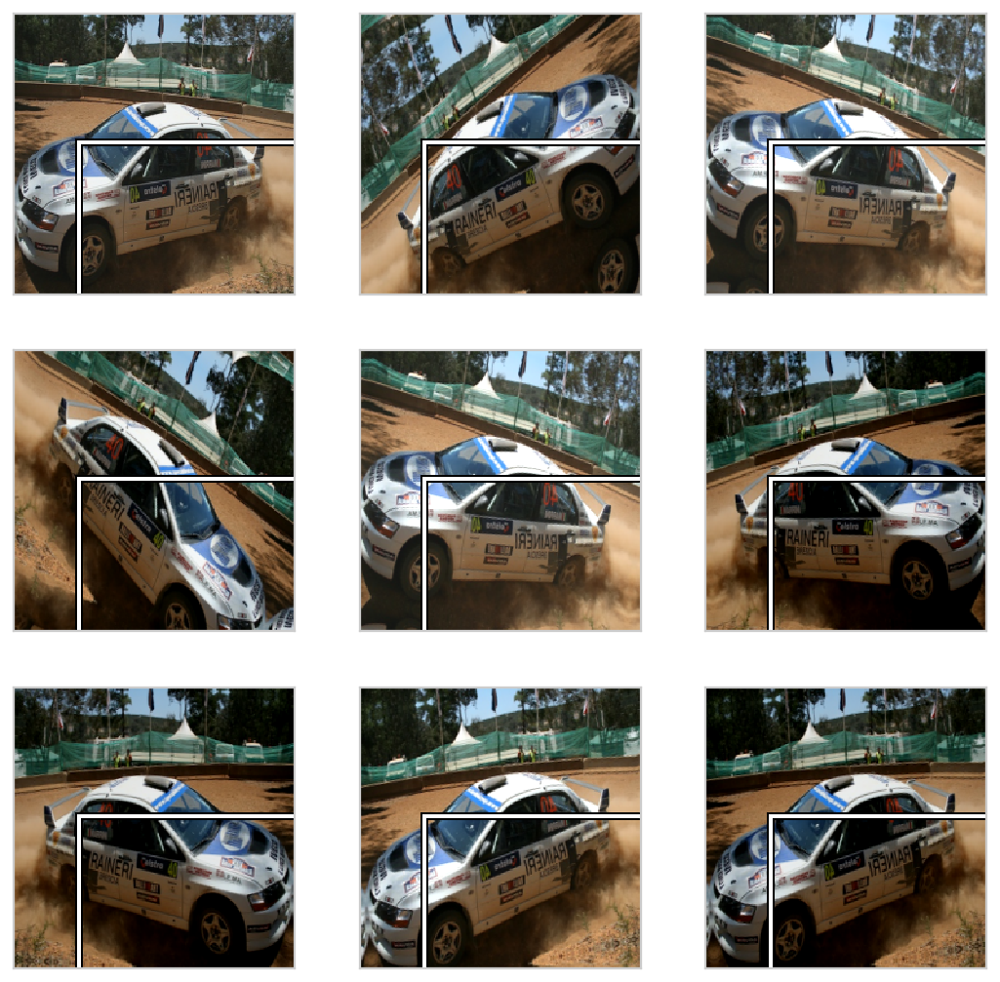

In [91]:
# 测试数据增广
idx = 5
fig,axes = plt.subplots(ncols=3,nrows=3,figsize=(9,9))
for i,ax in enumerate(axes.flat):
    x,y = next(iter(md.aug_dl))
    ima = md.val_ds.denorm(to_np(x))[idx]
    b = bb_hw(to_np(y[idx]))
    print(b)
    show_img(ima,ax=ax)
    draw_rect(ax, b)

上图可知框的增强方式不可以，扩增的bbox并不能包围住目标。

按照fast.ai作者的说法是需要指定transform的类型为坐标类型（tfmType.COORD）

In [94]:
# 数据增强，注意由于bbox的坐标属性，要指定COORD类型
augs = [RandomFlip(tfm_y=TfmType.COORD),
        RandomRotate(30, tfm_y=TfmType.COORD),
        RandomLighting(0.1,0.1, tfm_y=TfmType.COORD)]

In [95]:
tfms = tfms_from_model(f_model=f_model, sz=sz, aug_tfms=augs, crop_type=CropType.NO, tfm_y=TfmType.COORD)
md = ImageClassifierData.from_csv(path=PATH, folder=JPEGS, csv_fname=BB_CSV, tfms=tfms, continuous=True, bs= bs)

[  0.  59. 204. 164.]
[ 18.  58. 206. 165.]
[ 11.  42. 213. 181.]
[  1.  69. 199. 146.]
[  7.  31. 217. 192.]
[  0.   7. 204. 216.]
[  0.  27. 204. 196.]
[  0.  45. 203. 178.]
[ 20.   0. 204. 223.]


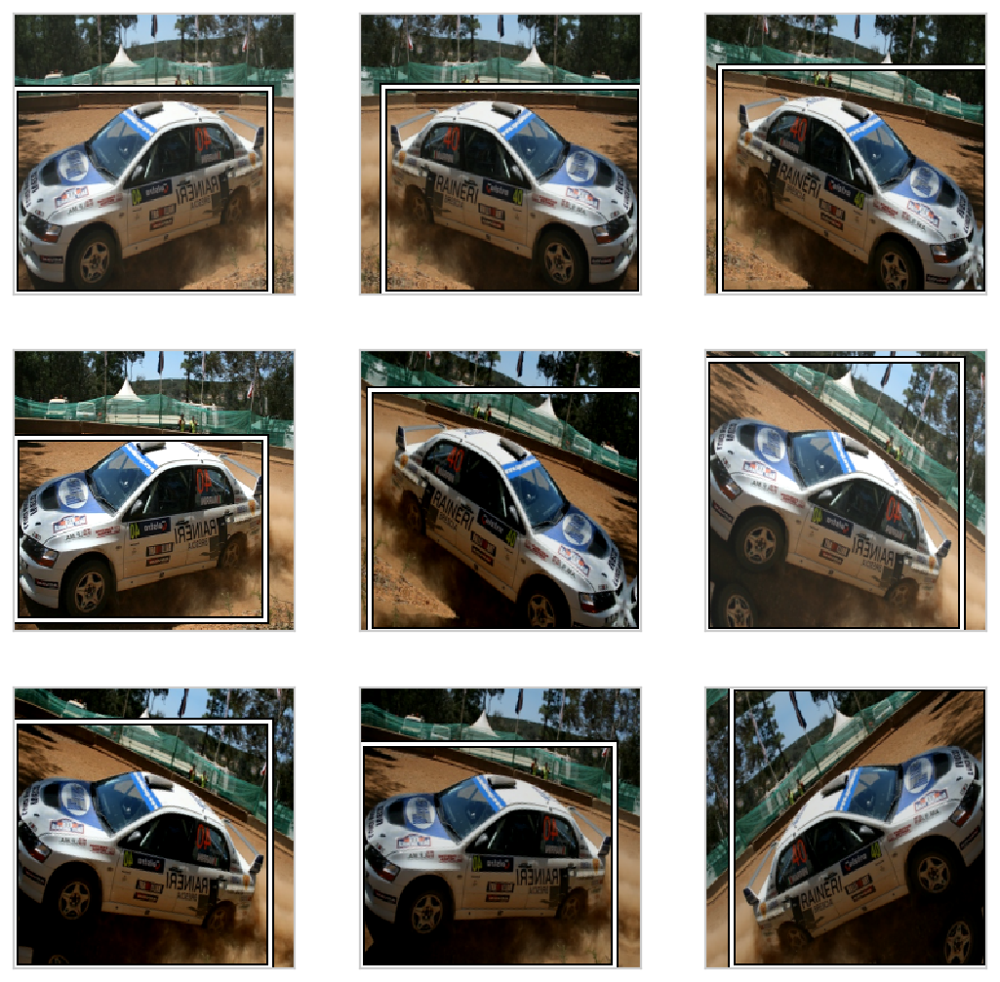

In [96]:
# 测试数据增广
idx = 5
fig,axes = plt.subplots(ncols=3,nrows=3,figsize=(9,9))
for i,ax in enumerate(axes.flat):
    x,y = next(iter(md.aug_dl))
    ima = md.val_ds.denorm(to_np(x))[idx]
    b = bb_hw(to_np(y[idx]))
    print(b)
    show_img(ima,ax=ax)
    draw_rect(ax, b)

这样的增强方式是对的。

In [98]:
# 重新设置扩增参数
tfm_y = TfmType.COORD
augs = [RandomFlip(tfm_y=tfm_y),
        RandomRotate(3, p=0.5, tfm_y=tfm_y), # 考虑到旋转后的BBOx得到的方式，角度不能过大。过大会引起目标不在BBOX中
        RandomLighting(0.05,0.05, tfm_y=tfm_y)]

tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=tfm_y, aug_tfms=augs)
md = ImageClassifierData.from_csv(PATH, JPEGS, BB_CSV, tfms=tfms, bs=bs, continuous=True)

#### 自定义 网络层

fast.ai 允许使用`custom_head`在卷积层之后添加自定义模块，而不是默认的adaptive pooling层和全连接层。

在本实验中，由于需要知道每个格点的activation强度，因此不能做池化。

最后一层有四个activations, 每个bbox的坐标。由于目标是连续的，而不是分类的，所以所以MSE损失函数并无帮助。

In [99]:
512*7*7

25088

In [100]:
head_reg4 = nn.Sequential(Flatten(), nn.Linear(25088, 4))
learn = ConvLearner.pretrained(f_model, md, custom_head=head_reg4)
learn.opt_fn = optim.Adam
learn.crit = nn.L1Loss() # 采用L1进行坐标预测的损失计算

In [101]:
# 查看模型
learn.summary()

OrderedDict([('Conv2d-1',
              OrderedDict([('input_shape', [-1, 3, 224, 224]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('trainable', False),
                           ('nb_params', 9408)])),
             ('BatchNorm2d-2',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('trainable', False),
                           ('nb_params', 128)])),
             ('ReLU-3',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 112, 112]),
                           ('nb_params', 0)])),
             ('MaxPool2d-4',
              OrderedDict([('input_shape', [-1, 64, 112, 112]),
                           ('output_shape', [-1, 64, 56, 56]),
                           ('nb_params', 0)])),
             ('Conv2d-5',
              OrderedDict([('input_shape', [-1, 64, 56, 

#### 训练

 78%|███████▊  | 25/32 [00:07<00:02,  2.74it/s, loss=361] 


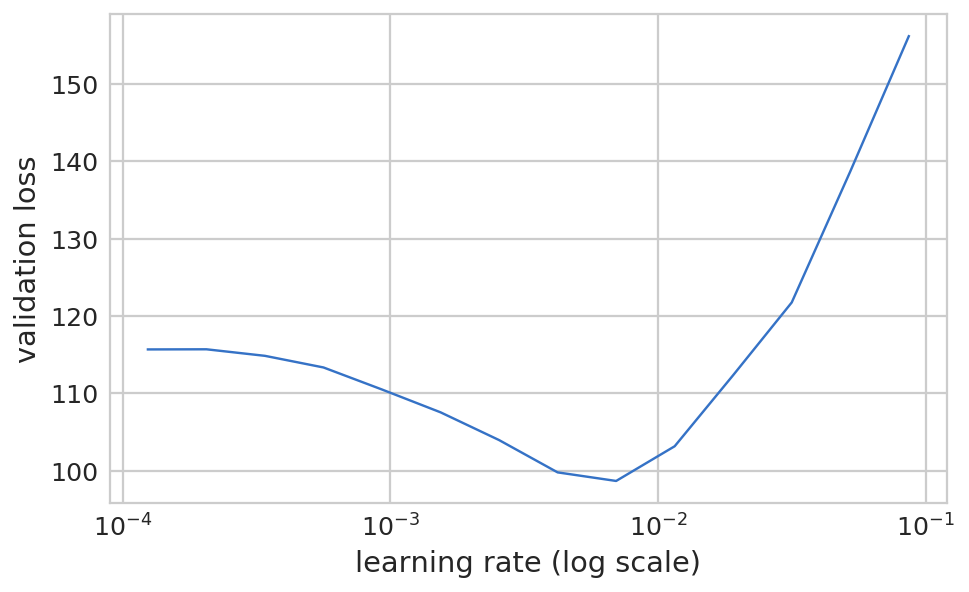

In [102]:
# 最优学习率
learn.lr_find(1e-5,100)
learn.sched.plot(5)

In [103]:
# 确认学习率
lr = 2e-3

In [105]:
learn.fit(lr, 2,cycle_len=1,cycle_mult=2)

epoch      trn_loss   val_loss                            
    0      47.500094  35.377468 
    1      36.438239  30.041442                           
    2      31.159879  28.646647                           



[array([28.64665])]

In [106]:
# differencial Learning rate
lrs = np.array([lr/100,lr/10,lr])

In [107]:
learn.freeze_to(-2)

epoch      trn_loss   val_loss                            
    0      74.022108  27465245354098.688



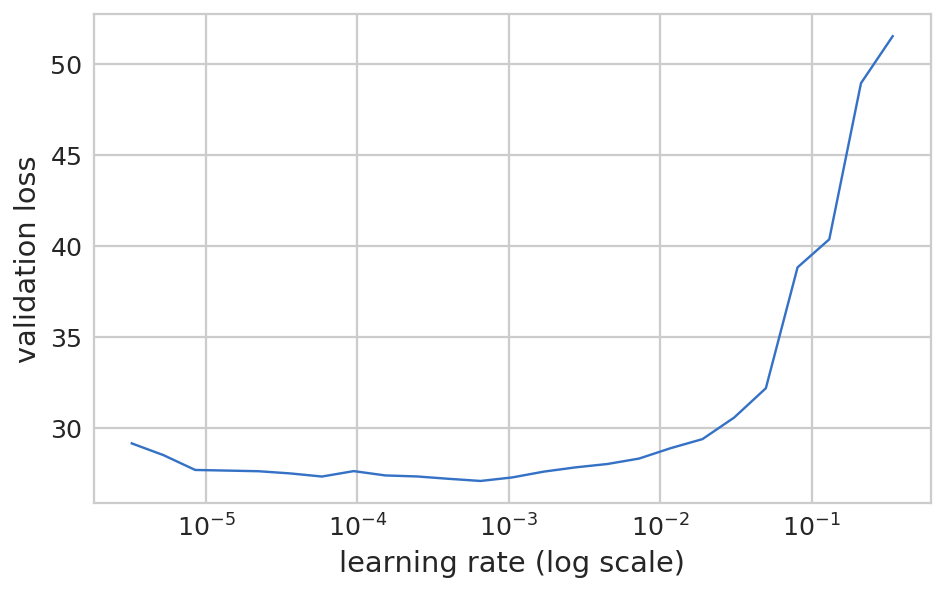

In [108]:
lrf=learn.lr_find(lrs/1000)
learn.sched.plot(1)

In [109]:
learn.fit(lrs, 2, cycle_len=1, cycle_mult=2)

epoch      trn_loss   val_loss                            
    0      25.365956  24.037737 
    1      22.525828  22.351341                           
    2      19.34687   21.012311                           



[array([21.01231])]

In [110]:
learn.freeze_to(-3)

In [111]:
learn.fit(lrs, 1, cycle_len=2)

epoch      trn_loss   val_loss                            
    0      17.857246  21.15573  
    1      15.792291  20.153743                           



[array([20.15374])]

In [112]:
learn.save('reg4')
learn.load('reg4')

In [115]:
# 预测一个batch
x,y = next(iter(md.val_dl))
learn.model.eval()
preds = to_np(learn.model(VV(x)))

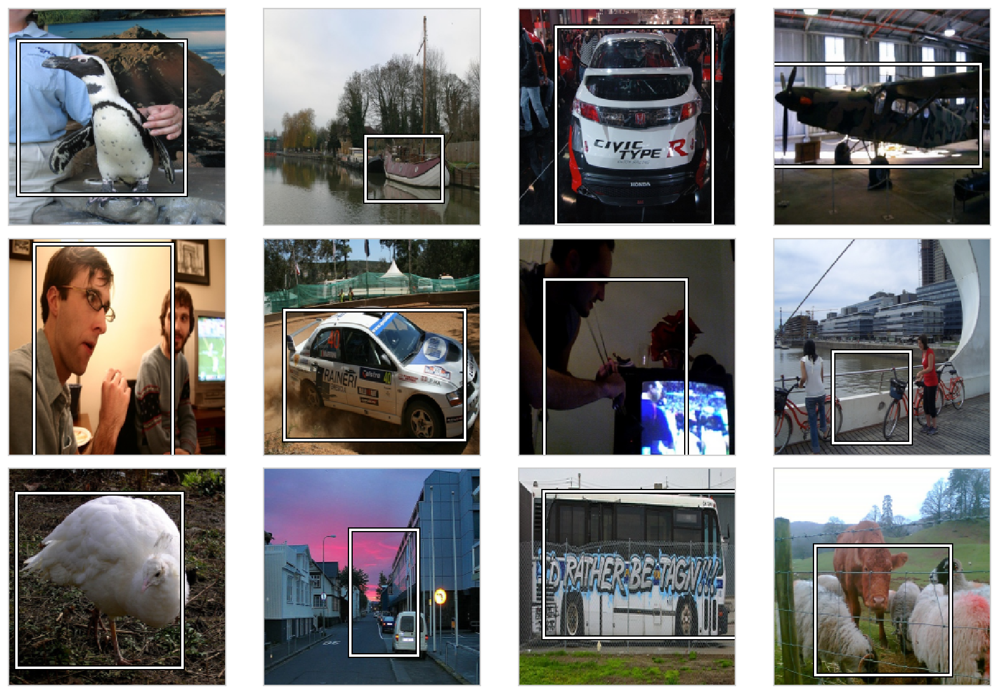

In [116]:
# 绘制预测结果
fig, axes = plt.subplots(3, 4, figsize=(12, 8))
for i,ax in enumerate(axes.flat):
    ima=md.val_ds.denorm(to_np(x))[i]
    b = bb_hw(preds[i])
    ax = show_img(ima, ax=ax)
    draw_rect(ax, b)
plt.tight_layout()

## 单目标检测

对于训练一个神经网络来说，最重要的就是三点
1. 数据
2. 网络结构
3. 损失函数

In [119]:
# 设置模型和超参数
f_model = resnet34
sz = 224
bs = 64

val_idxs = get_cv_idxs(len(trn_fns)) # 生成验证集

### 数据

In [122]:
# 设置transformer和dataset
tfms = tfms_from_model(f_model, sz, crop_type=CropType.NO, tfm_y=TfmType.COORD,aug_tfms=augs)
# bbox的dataset
md = ImageClassifierData.from_csv(PATH, JPEGS, BB_CSV,tfms=tfms, bs=bs, continuous=True, val_idxs=val_idxs)
# 分类的dataset
md2 = ImageClassifierData.from_csv(PATH, JPEGS, CSV, tfms=tfms_from_model(f_model=f_model, sz=sz))

dataset类可以根据`__len__`和`__getitem__`来自定义。

向已有dataset添加第二个label，由此构建一个同时包含BBox和标签的数据集。

In [123]:
class ConcatLblDataset(Dataset):
    def __init__(self, ds, y2):
        self.ds = ds
        self.y2 = y2
        
    def __len__(self):
        return len(self.ds)
    
    def __getitem__(self, i):
        x, y = self.ds[i]
        return (x, (y, self.y2[i]))

In [124]:
# 向已有的bboxdataset中添加分类dataset
trn_ds2 = ConcatLblDataset(md.trn_ds, md2.trn_y)
val_ds2 = ConcatLblDataset(md.val_ds,md2.val_y)

In [125]:
val_ds2[0][1]

(array([  0.,   1., 223., 178.], dtype=float32), 14)

In [126]:
# 替换得到新的dataset
md.trn_dl.dataset = trn_ds2
md.val_dl.dataset = val_ds2

In [128]:
# 查看新的dataset是否正常
x,y = next(iter(md.val_dl)) # 取一个batch
idx = 3
ima = md.val_ds.ds.denorm(to_np(x))[idx] # 取dataset中ds(即bbox数据集)
b = bb_hw(to_np(y[0][idx]));
b

array([  1.,  60., 223., 127.])

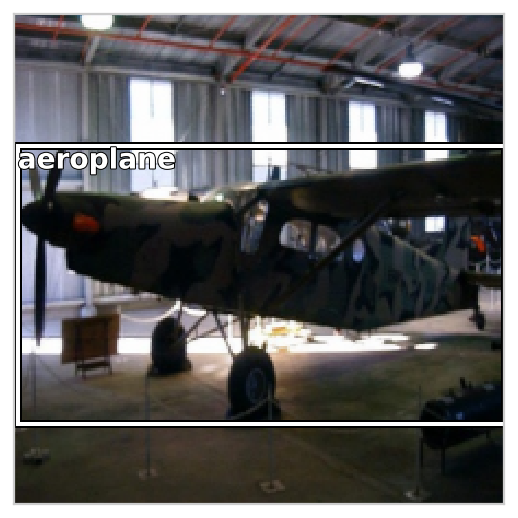

In [129]:
ax = show_img(ima)
draw_rect(ax, b)
draw_text(ax, b[:2], md2.classes[y[1][idx]]) # 取y[1]即y2即分类标签

### 网络结构

现在需要的输出是1. 各个类别的激活层（用于判断概率）和2. 生成每个bbox的坐标。

因此最后一层的activation具有4+C个。C表示类别数目.

这次使用线性层，然后加上dropout层提高可靠性。

In [133]:
# 自定义高级输出层的结构
head_reg4 = nn.Sequential(
    Flatten(),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(25088, 256),
    nn.ReLU(),
    nn.BatchNorm1d(256),
    nn.Dropout(0.5),
    nn.Linear(256, 4 + len(cats)),
)

# 使用custom_head自定义卷积层后的结构
models = ConvnetBuilder(f_model, 0, 0,0,custom_head=head_reg4)

learn = ConvLearner(md, models=models)
learn.opt_fn = optim.Adam

### 损失函数

定义损失函数和测量函数

In [134]:
# 损失函数是由bbox的l1_loss和分类的crossentropy共同计算得到的
def detn_loss(input, target):
    bb_t, c_t = target # goundTruth, 返回结构参考dataset的构造方式（get_item）
    bb_i, c_i = input[:, :4], input[:,4:] # activations
    bb_i = F.sigmoid(bb_i) * 224  # 图像size是224*224，sigmoid得到的是0-1之间的值，乘以224使之恢复成网络结构应该具有的大小范围
    return F.l1_loss(bb_i, bb_t) + F.cross_entropy(c_i, c_t)*20 # 20是尺度需要，使两者尺度相当

def detn_l1(input, target):
    bb_t, _ = target
    bb_i = input[:,:4]
    bb_i = F.sigmoid(bb_i) * 224
    return F.l1_loss(V(bb_i),V(bb_t)).data

def detn_acc(input, target):
    _,c_t = target
    c_i = input[:,4:]
    return accuracy(c_i, c_t)

learn.crit = detn_loss
learn.metrics = [detn_acc, detn_l1]

### 训练

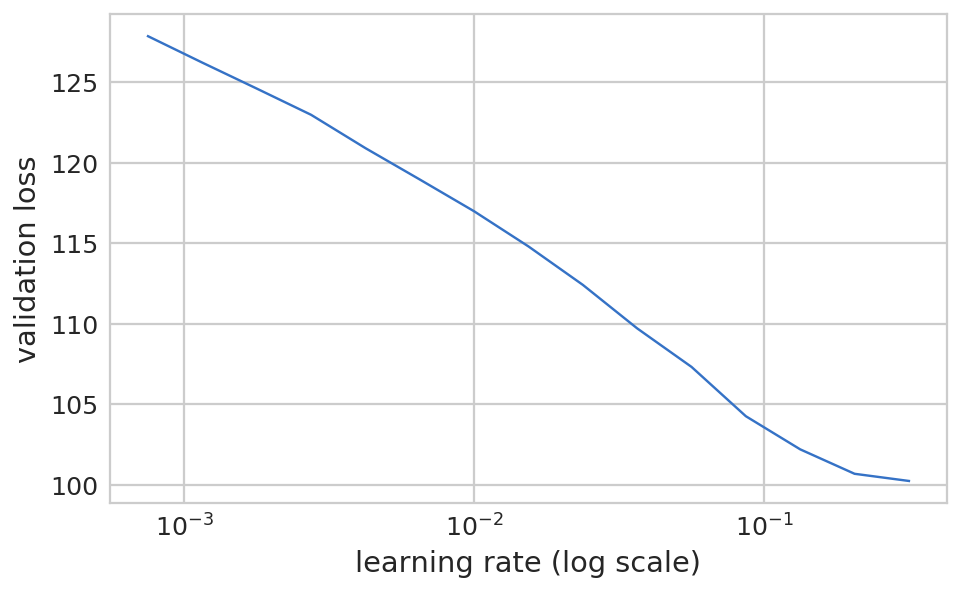

In [139]:
# 找最优lr
learn.lr_find()
learn.sched.plot()

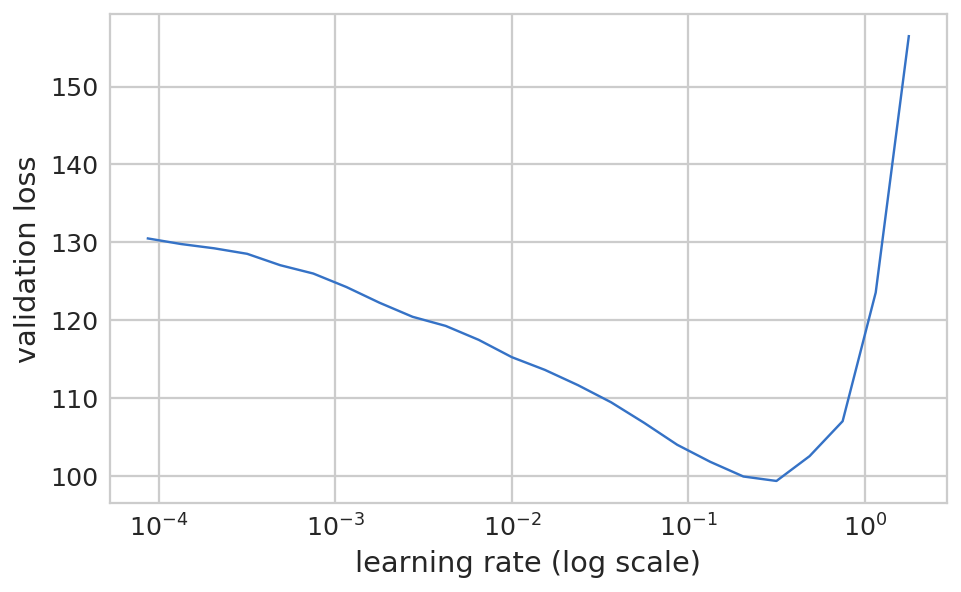

In [138]:
learn.sched.plot(n_skip=5, n_skip_end=1)

In [140]:
lr = 1e-2

In [141]:
learn.fit(lr, 1, cycle_len=3, use_clr=(32,5))

epoch      trn_loss   val_loss   detn_acc   detn_l1       
    0      73.021861  49.040769  0.762      33.868816 
    1      52.371605  39.897777  0.79       26.528015     
    2      43.085287  38.40951   0.782      25.693656     


[array([38.40951]), 0.7820000019073486, 25.693655502319334]

关于`use_clr`的含义，可以参考：[Understanding use_clr](https://forums.fast.ai/t/understanding-use-clr/13969)

In [142]:
learn.save('reg1_0')

In [143]:
learn.freeze_to(-2)

In [144]:
lrs = np.array([lr/100, lr/10, lr])

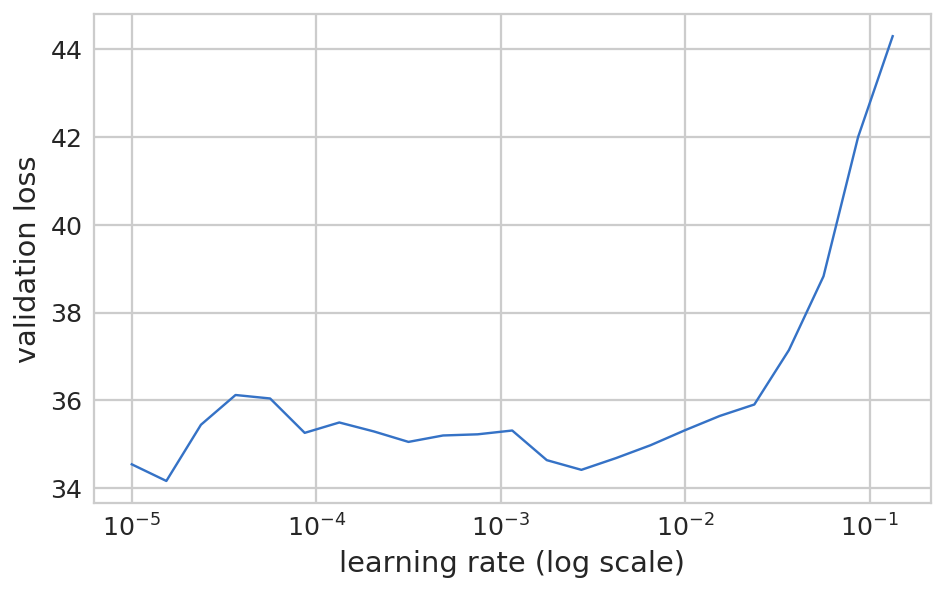

In [145]:
learn.lr_find(lrs/1000)
learn.sched.plot(0)

In [146]:
learn.fit(lrs/5,1,cycle_len=5,use_clr=(32,10))

epoch      trn_loss   val_loss   detn_acc   detn_l1       
    0      36.869526  38.903723  0.758      24.296154 
    1      31.326726  36.6155    0.766      21.896477     
    2      26.642102  33.09029   0.822      21.3755       
    3      23.477213  33.293454  0.804      21.018092     
    4      21.219933  32.841205  0.798      20.617818     


[array([32.84121]), 0.7979999985694886, 20.617818420410156]

In [148]:
learn.save('reg1_1')
learn.load('reg1_1')

In [149]:
learn.unfreeze()

In [150]:
# 继续训练
learn.fit(lrs/10, 1, cycle_len=10,use_clr=(32,10))

epoch      trn_loss   val_loss   detn_acc   detn_l1       
    0      18.538771  33.337069  0.808      20.696491 
    1      18.376943  33.852231  0.784      20.624054     
    2      17.561372  33.20553   0.802      20.648081     
    3      16.458471  33.816986  0.786      20.271821     
    4      15.660971  33.647833  0.792      20.05454      
    5      14.905726  32.912299  0.784      19.615759     
    6      14.223394  32.798715  0.79       19.627963     
    7      13.683377  33.002606  0.788      19.551473     
    8      13.335879  32.818987  0.79       19.443868     
    9      13.039377  32.798003  0.784      19.413067     


[array([32.798]), 0.784000002861023, 19.413067443847655]

尽管80%的准确率不咋地，因为ResNet这个网络本身是用来进行分类的，而不是预测BBOX的回归预测的。

**同时，可以看到的是，在做准确率（分类问题）和BBox同时预测是，L1损失看起来比只做BBox预测要低。这是为何？**

这样来看，判断出图像中的主要的物体是什么是比较困难的步骤，然后再去判断主要物体的BBox和类别相比之下较为轻松。所以当有一个用于预测图中主要物体是什么以及BBox在哪时，它们会共享所有的计算，共享则意味着计算的高效，当进行分类误差与定位误差的反向传播时，共享的信息能够有助于找到图像中最大的物体。

In [151]:
learn.save("reg1")
learn.load("reg1")

### 预测

In [152]:
# 取一个batch进行验证
y = learn.predict()
x,_ = next(iter(md.val_dl))

In [153]:
from scipy.special import expit

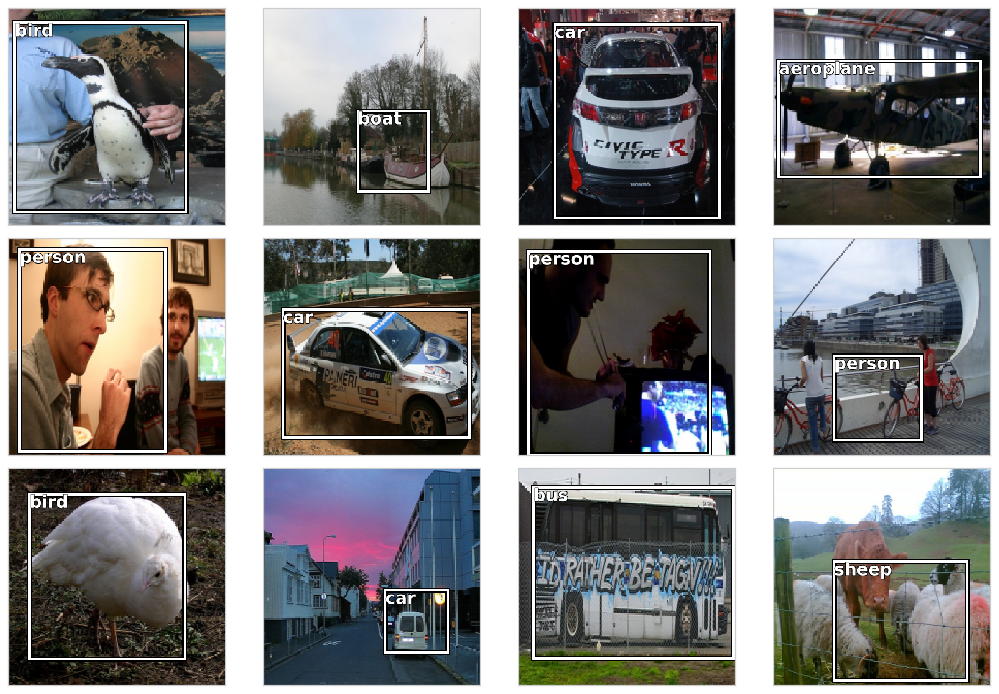

In [155]:
fig, axes = plt.subplots(3,4,figsize=(12,8))
for i,ax in enumerate(axes.flat):
    ima = md.val_ds.ds.denorm(to_np(x))[i]
    bb = expit(y[i][:4])*224 # expit就是logistic函数
    b = bb_hw(bb) # 转换为绘图用的bbox
    c = np.argmax(y[i][4:]) # 得到分类ID
    ax = show_img(ima, ax=ax)
    draw_rect(ax, b) # 画判断框
    draw_text(ax, b[:2], md2.classes[c]) # 将分类结果写上
plt.tight_layout()

这次主要展示的MultiBox目标检测中的第一步：single object detection（单目标的检测，图像中单个主要的目标）。

可以看到存在的问题是，当出现群体目标时，BBox会框住群体中心区域，这显然是不对的。